In [43]:
import warnings  # Permet de gérer les avertissements
warnings.filterwarnings("ignore", category=FutureWarning)

# Librairies générales
import pandas as pd  # Manipulation de données en format tabulaire
from scipy.stats import randint  # Pour les distributions aléatoires
import numpy as np  # Calcul numérique
from numpy import mean, std  # Statistiques de base
import os  # Interaction avec le système d'exploitation
from os import listdir  # Liste les fichiers dans un répertoire
from os.path import isfile, join  # Fonctions pour gérer les chemins de fichiers
import sys  # Manipulation du système
import random  # Génération de nombres aléatoires
import cv2  # Librairie pour la vision par ordinateur
import zipfile  # Manipulation des archives ZIP
import struct
import tarfile
import urllib.request
from os.path import join
from pathlib import Path

# Librairie d'affichage
import matplotlib.pyplot as plt  # Visualisation de données
from PIL import Image, ImageDraw, ImageFilter, ImageEnhance  # Manipulation d'images avec Pillow

# Scikit-learn pour l'apprentissage automatique
from sklearn.decomposition import PCA  # Analyse en composantes principales(ACP)

# TensorFlow et Keras pour le deep learning
import tensorflow as tf  # Framework principal pour l'apprentissage profond
import keras  # API de haut niveau pour TensorFlow
from keras import layers  # Modules de construction de modèles Keras
from keras import models  # Définition et manipulation des modèles
from keras import optimizers  # Optimisateurs pour les modèles Keras
from keras.optimizers import Adam  # Optimiseur Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator  #Générateur

# Utilitaires Keras pour le traitement d'images
from keras.utils import img_to_array, load_img  # Conversion images en tableaux
from keras.callbacks import (ModelCheckpoint,
                             EarlyStopping, ReduceLROnPlateau)  # Gestion des checkpoints
from keras import backend as K  # Backend Keras pour opérations de bas niveau
from keras.models import Model, load_model  # Définition/chargement des modèles
from keras.layers import LeakyReLU  # Activation LeakyReLU
from keras.preprocessing import image  # Prétraitement des images

# Couches Keras pour les modèles convolutifs et autres
from keras.layers import (Input, Conv2D, Flatten, Dense, Conv2DTranspose,
                          Reshape, Activation,
                          BatchNormalization,
                          Dropout, Concatenate )  # Couches pour CNN et autoencoders
from keras.layers import (InputLayer, MaxPooling2D,
                          UpSampling2D)

In [11]:
# Nom local de l'archive et URL source
zip_file = "Humans.zip"
zip_url = "https://www.lirmm.fr/~poncelet/Ressources/Humans.zip"

# Répertoire cible après extraction
src_dir = "Humans"
image_dir = os.path.join(src_dir, "train")

# Vérifie si le dossier de destination contient des images
def humans_already_present():
    return os.path.exists(image_dir) and any(f.endswith(".png") for f in os.listdir(image_dir))

# Téléchargement et extraction seulement si besoin
if not humans_already_present():
    print("Aucune image trouvée dans Humans/train. Téléchargement et extraction en cours...")

    # Télécharger si l'archive n'est pas déjà présente
    if not os.path.exists(zip_file):
        print(f"Téléchargement de {zip_file}...")
        !wget -O {zip_file} {zip_url}
    else:
        print(f"{zip_file} déjà présent, téléchargement ignoré.")

    # Extraction dans le répertoire courant
    with zipfile.ZipFile(zip_file, "r") as zip_ref:
      for member in zip_ref.namelist():
        if not member.startswith("__MACOSX"):
            zip_ref.extract(member, ".")


    print("Archive extraite dans le répertoire courant.")

    # Suppression de l'archive après extraction
    os.remove(zip_file)
else:
    print("Le dossier Humans/train existe déjà et contient des images. Téléchargement ignoré.")

Le dossier Humans/train existe déjà et contient des images. Téléchargement ignoré.


In [12]:
HUMANS_DIR = "Humans/train"
STL10_DIR  = 'STL10/train'
COMBINED_DIRS = [HUMANS_DIR, STL10_DIR] 

TARGET_SIZE = (128, 128)
BATCH_SIZE  = 32

os.makedirs(STL10_DIR, exist_ok=True)

Humans/train : 6834 images


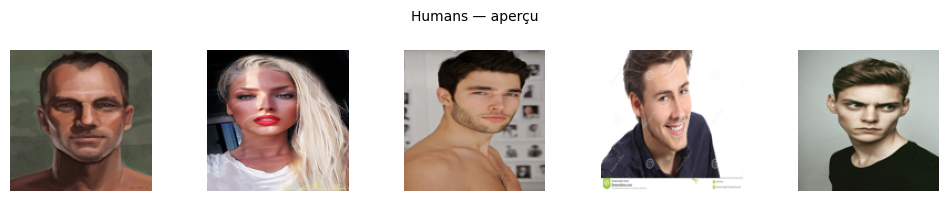

In [13]:
humans_files = [f for f in os.listdir(HUMANS_DIR) if f.endswith('.png')]
print(f'Humans/train : {len(humans_files)} images')

# Aperçu rapide
sample = random.sample(humans_files, 5)
fig, axes = plt.subplots(1, 5, figsize=(10, 2))
for ax, fname in zip(axes, sample):
    ax.imshow(Image.open(join(HUMANS_DIR, fname)))
    ax.axis('off')
plt.suptitle('Humans — aperçu', fontsize=10)
plt.tight_layout()
plt.show()

In [15]:
STL10_URL     = 'http://ai.stanford.edu/~acoates/stl10/stl10_binary.tar.gz'
STL10_ARCHIVE = 'stl10_binary.tar.gz'
STL10_N       = 12_000   # combien d'images on extrait du split unlabeled (max 100 000)


def download_stl10():
    if os.path.exists(STL10_ARCHIVE):
        print("supression car archive déjà présente")
        os.remove(STL10_ARCHIVE)

    print("téléchargement STL-10")

    urllib.request.urlretrieve(STL10_URL, STL10_ARCHIVE)

    if os.path.getsize(STL10_ARCHIVE) < 1e8: 
        raise ValueError("Téléchargement incomplet : fichier cassé")

    print("OK téléchargement terminé")


def extract_stl10_unlabeled(n=STL10_N):
    """
    Extrait n images du split 'unlabeled' de STL-10 vers STL10_DIR.

    Format binaire STL-10 :
    - Chaque image = 27 648 octets (3 canaux × 96 × 96)
    - Stockage channel-first : tous les R, puis tous les G, puis tous les B
    - Pas d'en-tête, juste une séquence d'images bout à bout

    On redimensionne à 128×128 en Lanczos (meilleure qualité que BILINEAR
    pour un upscaling de 96→128).
    """
    existing = [f for f in os.listdir(STL10_DIR) if f.endswith('.png')]
    if len(existing) >= n:
        print(f'STL10/train contient déjà {len(existing)} images, extraction ignorée.')
        return

    print(f'Extraction de {n} images depuis l\'archive...')

    with tarfile.open(STL10_ARCHIVE, 'r:gz') as tar:
        # Le fichier unlabeled est à ce chemin dans l'archive
        member = tar.getmember('stl10_binary/unlabeled_X.bin')
        f      = tar.extractfile(member)

        IMAGE_BYTES = 3 * 96 * 96   # 27 648 octets par image
        saved = 0

        while saved < n:
            raw = f.read(IMAGE_BYTES)
            if len(raw) < IMAGE_BYTES:
                break   # fin du fichier (ne devrait pas arriver avant 100 000)

            # Reshape channel-first → channel-last
            # (3, 96, 96) → transpose → (96, 96, 3)
            arr = np.frombuffer(raw, dtype=np.uint8)
            arr = arr.reshape(3, 96, 96).transpose(1, 2, 0)   # channel-last

            img = Image.fromarray(arr, mode='RGB')
            img = img.resize(TARGET_SIZE, Image.LANCZOS)   # 96→128

            img.save(join(STL10_DIR, f'stl10_{saved:06d}.png'))
            saved += 1

            if saved % 1000 == 0:
                print(f'  {saved}/{n} images extraites')

    print(f'Extraction terminée : {saved} images dans {STL10_DIR}')


# ── Exécution ─────────────────────────────────────────────────────────────────
download_stl10()
extract_stl10_unlabeled(n=STL10_N)

téléchargement STL-10
OK téléchargement terminé
Extraction de 12000 images depuis l'archive...
  1000/12000 images extraites
  2000/12000 images extraites
  3000/12000 images extraites
  4000/12000 images extraites
  5000/12000 images extraites
  6000/12000 images extraites
  7000/12000 images extraites
  8000/12000 images extraites
  9000/12000 images extraites
  10000/12000 images extraites
  11000/12000 images extraites
  12000/12000 images extraites
Extraction terminée : 12000 images dans STL10/train


STL10/train : 12000 images


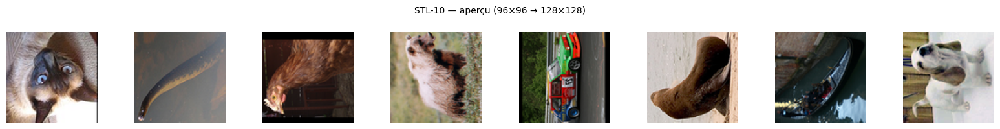


Total combiné : 6834 (Humans) + 12000 (STL-10) = 18834 images


In [16]:
# Vérification et aperçu
stl_files = [f for f in os.listdir(STL10_DIR) if f.endswith('.png')]
print(f'STL10/train : {len(stl_files)} images')

sample = random.sample(stl_files, 8)
fig, axes = plt.subplots(1, 8, figsize=(16, 2))
for ax, fname in zip(axes, sample):
    ax.imshow(Image.open(join(STL10_DIR, fname)))
    ax.axis('off')
plt.suptitle('STL-10 — aperçu (96×96 → 128×128)', fontsize=10)
plt.tight_layout()
plt.show()

# Bilan
total = len(humans_files) + len(stl_files)
print(f'\nTotal combiné : {len(humans_files)} (Humans) + {len(stl_files)} (STL-10) = {total} images')

In [17]:
def addMask(image: Image.Image) -> np.array :
    """ Ajoute un masque noir de taille aléatoire à une position aléatoire"""
    size = random.randint(30,60)
    start = random.randint(0,128-size)
    out = image.copy()
    ImageDraw.Draw(out).rectangle(
        [(start, start), (start + size, start + size)], fill='black'
    )
    return np.array(out)
    
def addNoise(image: Image.Image, level: float = 4.0) -> Image.Image:
    """Ajoute du bruit gaussien, l'intensité est varié d'une image à l'autre"""
    scale = 25 * level * random.uniform(0.8, 1.2)
    arr = np.array(image, dtype=np.float32)
    noisy = arr + np.random.normal(0, scale, arr.shape)
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return Image.fromarray(noisy)

def rgbToGreyScale(image: Image.Image) -> np.ndarray:
    """Convertit l'image rgb au niveau de gris"""
    gray = image.convert("L").resize((128, 128))
    arr = np.array(gray)
    return np.stack([arr] * 3, axis=-1)

def addBlur(image: Image.Image, radius: float = None) -> np.ndarray:
    """Applique un flou gaussien """
    if radius is None:
        radius = random.uniform(2.0, 5.0)
    blurred = image.filter(ImageFilter.GaussianBlur(radius=radius))
    return np.array(blurred)

def combined_filters(image: Image.Image) -> np.ndarray:
    """Applique aléatoirement une combinaison de corruptions """
    img = image.copy()
    if random.random() < 0.5:
        img = addNoise(img, level=2.0)        
    if random.random() < 0.5:
        img = Image.fromarray(addMask(img))
    if random.random() < 0.3:
        img = Image.fromarray(addBlur(img))   
    return np.array(img)


#autres filtres à tester si ça marche avec les autres fonctions :

def add_scratch(image: Image.Image) -> np.ndarray:
    """Ajoute des rayures aléatoires (comme sur une vieille pellicule)"""
    img = np.array(image)
    num_scratch = random.randint(1, 5)
    for _ in range(num_scratch):
        y_start = random.randint(0, img.shape[0])
        x_start = random.randint(0, img.shape[1])
        length = random.randint(20, 100)
        thickness = random.randint(1, 3)
        angle = random.uniform(0, 2 * np.pi)
        x_end = int(x_start + length * np.cos(angle))
        y_end = int(y_start + length * np.sin(angle))
        cv2.line(img, (x_start, y_start), (x_end, y_end), 
                 (255, 255, 255) if random.random() > 0.5 else (0, 0, 0), thickness)
    return img

def add_dust_and_scratches(image: Image.Image) -> np.ndarray:
    """Ajoute de la poussière (petits points blancs/noirs)"""
    img = np.array(image)
    mask = np.random.random(img.shape[:2]) < 0.005  # 0.5% de pixels
    dust_color = np.random.choice([0, 255], size=mask.sum())
    img[mask] = dust_color[:, np.newaxis]
    return img

def add_jpeg_artifacts(image: Image.Image, quality: int = None) -> np.ndarray:
    """Simule une compression JPEG agressive"""
    if quality is None:
        quality = random.randint(10, 60)
    _, encoded = cv2.imencode('.jpg', cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR), 
                               [cv2.IMWRITE_JPEG_QUALITY, quality])
    decoded = cv2.imdecode(encoded, cv2.IMREAD_COLOR)
    return cv2.cvtColor(decoded, cv2.COLOR_BGR2RGB)

def add_pixelation(image: Image.Image, block_size: int = None) -> np.ndarray:
    """Effet pixelisé (comme une basse résolution)"""
    if block_size is None:
        block_size = random.randint(4, 16)
    h, w = image.size
    small = image.resize((w // block_size, h // block_size), Image.NEAREST)
    return np.array(small.resize((w, h), Image.NEAREST))

def add_glitch_effect(image: Image.Image) -> np.ndarray:
    """Effet 'glitch' numérique (décalage de bandes)"""
    img = np.array(image)
    h, w = img.shape[:2]
    num_glitches = random.randint(3, 10)
    
    for _ in range(num_glitches):
        y_start = random.randint(0, h - 20)
        y_end = y_start + random.randint(5, 30)
        shift = random.randint(-30, 30)
        
        # Décale une bande horizontale
        glitch_band = img[y_start:y_end, :].copy()
        if shift > 0:
            glitch_band = np.roll(glitch_band, shift, axis=1)
            if shift > 0:
                glitch_band[:, :shift] = 0
        else:
            glitch_band = np.roll(glitch_band, shift, axis=1)
            if shift < 0:
                glitch_band[:, shift:] = 0
        img[y_start:y_end, :] = glitch_band
    
    return img

#dictionnaire
corruption_funcs = {
    'mask' : lambda img: addMask(img),
    'noise' : lambda img: np.array(addNoise(img)),
    'blur' : lambda img: addBlur(img),
    'blackwhite' : lambda img: rgbToGreyScale(img),
    'combined' : lambda img: combined_filters(img),
}

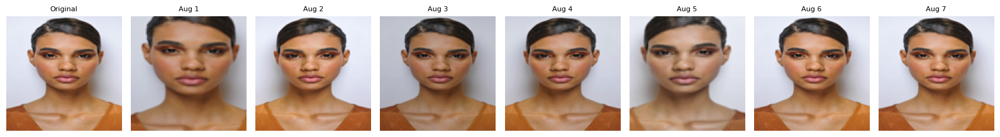

In [20]:
def augment(img: Image.Image) -> Image.Image:
    """
    Augmentation légère appliquée sur l'image originale.
    Paramètre : PIL Image RGB 128×128
    Retour    : PIL Image RGB 128×128 augmentée
    """

    # flip horizontal 
    if random.random() < 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)

    # random crop + resize 
    if random.random() < 0.3:
        margin = random.randint(6, 18)
        img = img.crop((margin, margin, 128 - margin, 128 - margin))
        img = img.resize(TARGET_SIZE, Image.BILINEAR)

    # saturation 
    if random.random() < 0.4:
        factor = random.uniform(0.6, 1.4)
        img = ImageEnhance.Color(img).enhance(factor)

    # luminosité
    if random.random() < 0.3:
        factor = random.uniform(0.75, 1.25)
        img = ImageEnhance.Brightness(img).enhance(factor)

    return img


# démo
test_path = join(HUMANS_DIR, random.choice(humans_files))
test_img  = Image.open(test_path).convert('RGB')

fig, axes = plt.subplots(1, 8, figsize=(16, 2.5))
axes[0].imshow(test_img);  axes[0].set_title('Original', fontsize=8);  axes[0].axis('off')
for i in range(1, 8):
    axes[i].imshow(augment(test_img))
    axes[i].set_title(f'Aug {i}', fontsize=8)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

In [34]:
def make_generator(
    folders: list,     
    target_size: tuple, 
    batch_size: int,
    typeimage: str  = 'blackwhite',
    shuffle: bool = True,
    use_augment: bool = True 
):
    """
    géénérateur infini de paires (corrompue, originale) depuis plusieurs dossiers.

    Différences avec myImageGenerator :
    - Accepte une liste de dossiers
    - applique augment() avant la corruption (train) si use_augment = True
    """
    corrupt_fn = corruption_funcs[typeimage]
    all_files = []
    for folder in folders:
        all_files += [
            join(folder, f)
            for f in os.listdir(folder)
            if f.endswith('.png')
        ]

    print(f'[make_generator] {len(all_files)} images au total '
          f'({typeimage}, augment={use_augment})')

    if shuffle:
        random.shuffle(all_files)

    idx = 0
    while True:
        if idx + batch_size > len(all_files):
            if shuffle:
                random.shuffle(all_files)
            idx = 0

        batch_paths = all_files[idx : idx + batch_size]
        originals, corrupted = [], []

        for path in batch_paths:
            img = Image.open(path).convert('RGB').resize(target_size, Image.BILINEAR)
            
            if use_augment:
                img = augment(img)

            originals.append(np.array(img) / 255.0)
            corrupted.append(corrupt_fn(img) / 255.0)

        idx += batch_size
        yield (
            np.array(corrupted,  dtype=np.float32),
            np.array(originals,  dtype=np.float32)
        )

[make_generator] 18834 images au total (blackwhite, augment=True)
Shape corrupted : (8, 128, 128, 3)
Shape original  : (8, 128, 128, 3)
Range [min, max] : [0.00, 1.00]


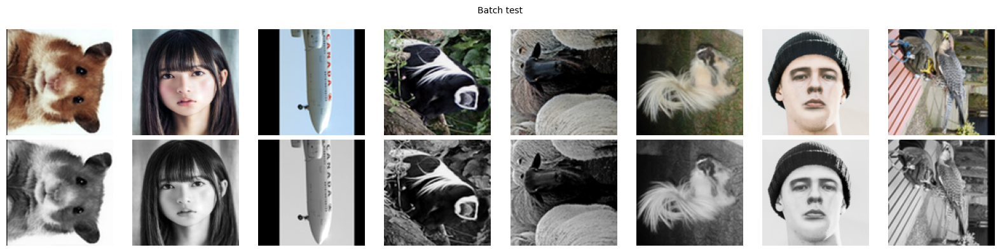

In [35]:
test_gen   = make_generator(COMBINED_DIRS, TARGET_SIZE, batch_size=8,
                             typeimage='blackwhite', use_augment=True)
x_corr, x_orig = next(test_gen)

print(f'Shape corrupted : {x_corr.shape}')  
print(f'Shape original  : {x_orig.shape}') 
print(f'Range [min, max] : [{x_corr.min():.2f}, {x_corr.max():.2f}]')

fig, axes = plt.subplots(2, 8, figsize=(16, 4))
for i in range(8):
    axes[0, i].imshow(x_orig[i])
    axes[0, i].axis('off')
    axes[1, i].imshow(x_corr[i], cmap='gray')
    axes[1, i].axis('off')
axes[0, 0].set_ylabel('Originale', fontsize=9)
axes[1, 0].set_ylabel('N&B', fontsize=9)
plt.suptitle('Batch test', fontsize=10)
plt.tight_layout()
plt.show()

In [36]:
n_humans = len([f for f in os.listdir(HUMANS_DIR) if f.endswith('.png')])
n_stl = len([f for f in os.listdir(STL10_DIR)  if f.endswith('.png')])
n_total = n_humans + n_stl

steps_train = max(1, int(n_total * 0.8) // BATCH_SIZE)
steps_val = max(1, int(n_total * 0.2) // BATCH_SIZE)

print('=' * 45)
print(f'  Humans/train  : {n_humans:>6} images')
print(f'  STL10/train   : {n_stl:>6} images')
print(f'  Total brut    : {n_total:>6} images')
print(f'  Avec augment  : ~{n_total * 3:>5} images effectives (×3 diversité)')
print('=' * 45)
print(f'  steps_per_epoch (train, 80 %) : {steps_train}')
print(f'  validation_steps  (val, 20 %) : {steps_val}')
print('=' * 45)
print()
print('Utilisation dans train_task() :')
print()
print('  train_gen = make_generator(COMBINED_DIRS, TARGET_SIZE,')
print('                              BATCH_SIZE, typeimage, use_augment=True)')
print('  val_gen   = make_generator(COMBINED_DIRS, TARGET_SIZE,')
print('                              BATCH_SIZE, typeimage, use_augment=False)')

  Humans/train  :   6834 images
  STL10/train   :  12000 images
  Total brut    :  18834 images
  Avec augment  : ~56502 images effectives (×3 diversité)
  steps_per_epoch (train, 80 %) : 470
  validation_steps  (val, 20 %) : 117

Utilisation dans train_task() :

  train_gen = make_generator(COMBINED_DIRS, TARGET_SIZE,
                              BATCH_SIZE, typeimage, use_augment=True)
  val_gen   = make_generator(COMBINED_DIRS, TARGET_SIZE,
                              BATCH_SIZE, typeimage, use_augment=False)


In [65]:
def l1_loss(y_true, y_pred):
    return tf.reduce_mean(tf.abs(y_true - y_pred))

def mix_loss(alpha=0.84):
    def loss(y_true, y_pred):
        ms = tf.image.ssim_multiscale(y_true, y_pred, max_val=1.0)
        ms = tf.clip_by_value(ms, 0.0, 1.0)
        return alpha * (1.0 - tf.reduce_mean(ms)) + (1.0 - alpha) * l1_loss(y_true, y_pred)
    loss.__name__ = f'mix_loss_a{int(alpha*100)}'
    return loss

def make_warmup_loss(final_alpha=0.84):
    """
    Retourne (loss_fn, alpha_var) où alpha_var est une tf.Variable.
    """
    # démare avec l1
    alpha_var = tf.Variable(0.0, trainable=False, dtype=tf.float32, name='ssim_alpha')

    def loss_fn(y_true, y_pred):
        l1 = tf.reduce_mean(tf.abs(y_true - y_pred))

        #partie MS-SSIM 
        # tf.cond évite de calculer MS-SSIM inutilement pendant le warm-up
        ms =  1.0 - tf.reduce_mean(
            tf.clip_by_value(
                tf.image.ssim(y_true, y_pred, max_val=1.0),
                0.0, 1.0
            )
        )

        return alpha_var * ms + (1.0 - alpha_var) * l1

    loss_fn.__name__ = 'warmup_mix_loss'
    return loss_fn, alpha_var


class WarmupLossCallback(tf.keras.callbacks.Callback):
    """
    Modifie alpha_var à la fin de l'époque de warm-up.
    """
    def __init__(self, alpha_var, warmup_epochs, final_alpha=0.84):
        super().__init__()
        self.alpha_var     = alpha_var
        self.warmup_epochs = warmup_epochs
        self.final_alpha   = final_alpha
        self.switched      = False

    def on_epoch_end(self, epoch, logs=None):
        if epoch == self.warmup_epochs - 1 and not self.switched:
            self.alpha_var.assign(self.final_alpha)
            self.switched = True
            print(f'\n[WarmupLoss] époque {epoch+1} : '
                  f'alpha 0.0 to {self.final_alpha}  (MS-SSIM activé)')

In [66]:
def build_unet_autoencoder(input_shape=(128, 128, 3)):
    def conv_block(x, filters, name):
        x = Conv2D(filters, 3, strides=2, padding='same', name=f'{name}_conv')(x)
        x = BatchNormalization(name=f'{name}_bn')(x)
        x = LeakyReLU(name=f'{name}_act')(x)
        return x
    def deconv_block(x, skip, filters, name):
        x = Conv2DTranspose(filters, 3, strides=2, padding='same', name=f'{name}_deconv')(x)
        x = BatchNormalization(name=f'{name}_bn1')(x)
        x = LeakyReLU(name=f'{name}_act1')(x)
        x = Concatenate(name=f'{name}_skip')([x, skip])
        x = Conv2D(filters, 3, padding='same', name=f'{name}_merge')(x)
        x = BatchNormalization(name=f'{name}_bn2')(x)
        x = LeakyReLU(name=f'{name}_act2')(x)
        return x
    inputs = Input(shape=input_shape, name='input')
    e1 = conv_block(inputs, 32,  'enc1')
    e2 = conv_block(e1,     64,  'enc2')
    e3 = conv_block(e2,     128, 'enc3')
    e4 = conv_block(e3,     256, 'enc4')
    bn = conv_block(e4,     256, 'bottleneck')
    d4 = deconv_block(bn, e4, 256, 'dec4')
    d3 = deconv_block(d4, e3, 128, 'dec3')
    d2 = deconv_block(d3, e2,  64, 'dec2')
    d1 = deconv_block(d2, e1,  32, 'dec1')
    outputs = Conv2DTranspose(3, 3, strides=2, padding='same',
                               activation='sigmoid', name='output')(d1)
    return Model(inputs, outputs, name='unet_autoencoder')

In [67]:
def get_fresh_model():
    """
    Crée un nouveau modèle U-Net avec des poids aléatoires.
    """
    tf.keras.backend.clear_session()
    model = build_unet_autoencoder()
    return model

In [68]:
model_dir = './aeplus_models/'
EPOCHS    = 50
PATIENCE  = 10

In [69]:
def train_task(typeimage, model_name, epochs=EPOCHS, warmup=7, final_alpha=0.84):
    """
    Entraîne un U-Net propre sur une tâche de restauration

    Paramètres :
    - typeimage  : 'blackwhite', 'mask', 'noise', 'blur', 'combined'
    - model_name : nom du fichier .keras à sauvegarder
    - epochs     : nombre max d'époques
    - warmup     : nb d'époques avec L1 seul avant d'activer MS-SSIM
    - alpha      : poids de MS-SSIM dans mix_loss 
    """
    print(f'\n{"═"*60}')
    print(f'  Tâche : {typeimage} saved in {model_name}, warmup : {warmup} ep.   alpha_final : {final_alpha}')
    print(f'{"═"*60}\n')

    model = get_fresh_model()
    # créer la loss et récupérer la var qu'on passera au callback
    loss_fn, alpha_var = make_warmup_loss(final_alpha=final_alpha)
    model.compile(optimizer=Adam(1e-3), loss=loss_fn)

    #n_images    = len([f for f in os.listdir(image_dir) if f.endswith('.png')])
    steps_train = max(1, int(n_total * 0.8) // BATCH_SIZE)
    steps_val   = max(1, int(n_total * 0.2) // BATCH_SIZE)

    train_gen = make_generator(COMBINED_DIRS, TARGET_SIZE, BATCH_SIZE,
                                typeimage, shuffle=True,  use_augment=True)
    val_gen   = make_generator(COMBINED_DIRS, TARGET_SIZE, BATCH_SIZE,
                                typeimage, shuffle=False, use_augment=False)

    model_path = join(model_dir, model_name)

    callbacks = [
        WarmupLossCallback(alpha_var=alpha_var, warmup_epochs=warmup, final_alpha=final_alpha), 
        EarlyStopping(
            monitor='val_loss', patience=PATIENCE,
            restore_best_weights=True, verbose=1),
        ModelCheckpoint(
            filepath=model_path, monitor='val_loss',
            save_best_only=True, verbose=0 ),
        ReduceLROnPlateau(
            monitor='val_loss', factor=0.5,
            patience=4, min_lr=1e-6, verbose=1),
    ]

    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        steps_per_epoch=steps_train,
        validation_steps=steps_val,
        callbacks=callbacks,
        verbose=1
    )

    plot_history(history, typeimage)
    return model, history


def plot_history(history, title=''):
    """Courbe d'apprentissage avec annotation du point de switch loss."""
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.plot(history.history['loss'],     label='Entraînement', lw=2)
    ax.plot(history.history['val_loss'], label='Validation',   lw=2, linestyle='--')
    ax.set_xlabel('Époque')
    ax.set_ylabel('Perte')
    ax.set_title(f"Courbe d'apprentissage {title}")
    ax.legend()
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


════════════════════════════════════════════════════════════
  Tâche : blackwhite saved in unet_bw_combined.keras, warmup : 10 ep.   alpha_final : 0.84
════════════════════════════════════════════════════════════

[make_generator] 18834 images au total (blackwhite, augment=True)
Epoch 1/50
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - loss: 0.0794[make_generator] 18834 images au total (blackwhite, augment=False)
470/470 ━━━━━━━━━━━━━━━━━━━━ 189s 394ms/step - loss: 0.0604 - val_loss: 0.0775 - learning_rate: 0.0010
Epoch 2/50
470/470 ━━━━━━━━━━━━━━━━━━━━ 178s 379ms/step - loss: 0.0507 - val_loss: 0.0449 - learning_rate: 0.0010
Epoch 3/50
470/470 ━━━━━━━━━━━━━━━━━━━━ 176s 374ms/step - loss: 0.0491 - val_loss: 0.0562 - learning_rate: 0.0010
Epoch 4/50
470/470 ━━━━━━━━━━━━━━━━━━━━ 176s 374ms/step - loss: 0.0481 - val_loss: 0.0696 - learning_rate: 0.0010
Epoch 5/50
470/470 ━━━━━━━━━━━━━━━━━━━━ 173s 368ms/step - loss: 0.0480 - val_loss: 0.0517 - learning_rate: 0.0010
Epoch 6/50
470/470 ━━━━━━

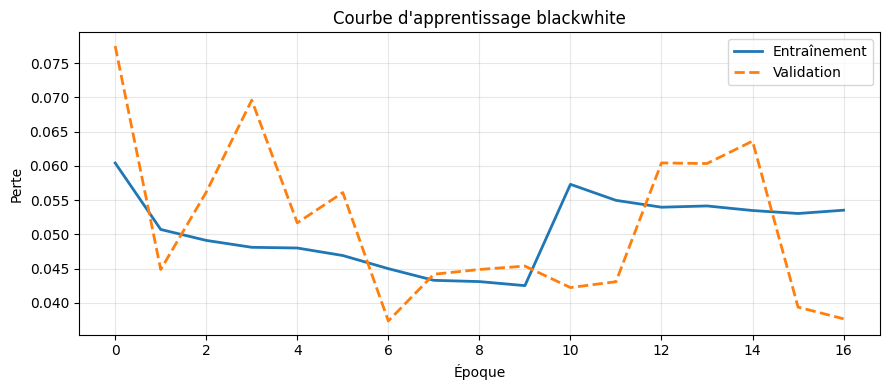

In [70]:
model_bw, history_bw = train_task(
    typeimage  = 'blackwhite',
    model_name = 'unet_bw_combined.keras',
    epochs     = 50,
    warmup     = 10,
    final_alpha      = 0.84
)

[make_generator] 18834 images au total (blackwhite, augment=False)


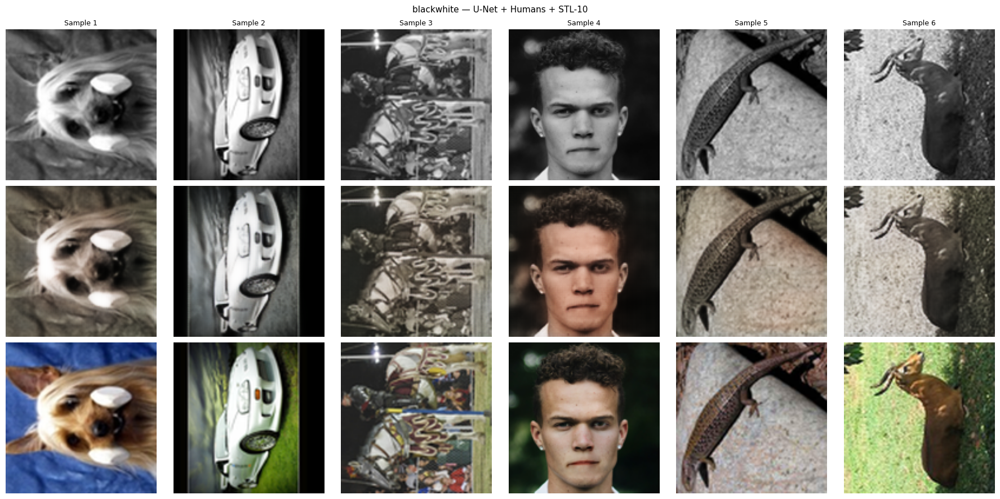

In [71]:
def compute_psnr(y_true, y_pred):
    return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))
    
def show_reconstruction(model, typeimage, n=6):
    gen             = make_generator(COMBINED_DIRS, TARGET_SIZE,
                                     batch_size=n, typeimage=typeimage,
                                     use_augment=False)
    corrupted, orig = next(gen)
    recon           = model.predict(corrupted, verbose=0)

    fig, axes = plt.subplots(3, n, figsize=(3 * n, 9))
    for i in range(n):
        score = compute_psnr(orig[i], recon[i]).numpy()
        color = 'green' if score > 25 else 'firebrick'
        cmap  = 'gray' if typeimage == 'blackwhite' else None

        axes[0, i].imshow(np.clip(corrupted[i], 0, 1), cmap=cmap)
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Sample {i+1}', fontsize=9)

        axes[1, i].imshow(np.clip(recon[i], 0, 1))
        axes[1, i].axis('off')
        axes[1, i].set_xlabel(f'PSNR {score:.1f} dB', color=color, fontsize=8)

        axes[2, i].imshow(np.clip(orig[i], 0, 1))
        axes[2, i].axis('off')

    axes[0, 0].set_ylabel('N&B',          fontsize=11)
    axes[1, 0].set_ylabel('Reconstruite', fontsize=11)
    axes[2, 0].set_ylabel('Originale',    fontsize=11)
    plt.suptitle(f'{typeimage} — U-Net + Humans + STL-10', fontsize=11)
    plt.tight_layout()
    plt.show()

show_reconstruction(model_bw, 'blackwhite')


════════════════════════════════════════════════════════════
  Tâche : mask saved in unet_mask_best.keras, warmup : 5 ep.   alpha_final : 0.84
════════════════════════════════════════════════════════════

[make_generator] 18834 images au total (mask, augment=True)
Epoch 1/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step - loss: 0.0770[make_generator] 18834 images au total (mask, augment=False)
470/470 ━━━━━━━━━━━━━━━━━━━━ 180s 375ms/step - loss: 0.0565 - val_loss: 0.0832 - learning_rate: 0.0010
Epoch 2/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 178s 378ms/step - loss: 0.0436 - val_loss: 0.0509 - learning_rate: 0.0010
Epoch 3/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 178s 378ms/step - loss: 0.0400 - val_loss: 0.0402 - learning_rate: 0.0010
Epoch 4/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 182s 386ms/step - loss: 0.0391 - val_loss: 0.0479 - learning_rate: 0.0010
Epoch 5/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - loss: 0.0380
[WarmupLoss] époque 5 : alpha 0.0 to 0.84  (MS-SSIM activé)
470/470 ━━━━━━━━━━━━━━━━━━━━ 18

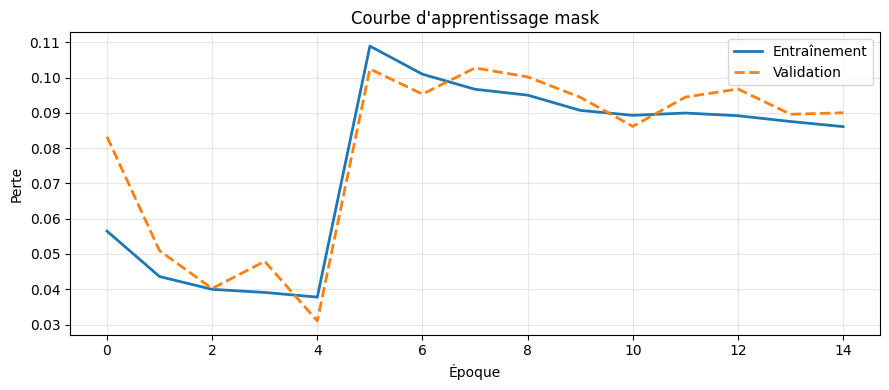

In [72]:
model_mask, history_mask = train_task(
    typeimage  = 'mask',
    model_name = 'unet_mask_best.keras',
    epochs     = 30, #moins d'epochs car c'est plus facile que la colorisation
    warmup     = 5,
    final_alpha      = 0.84
)

[make_generator] 18834 images au total (mask, augment=False)


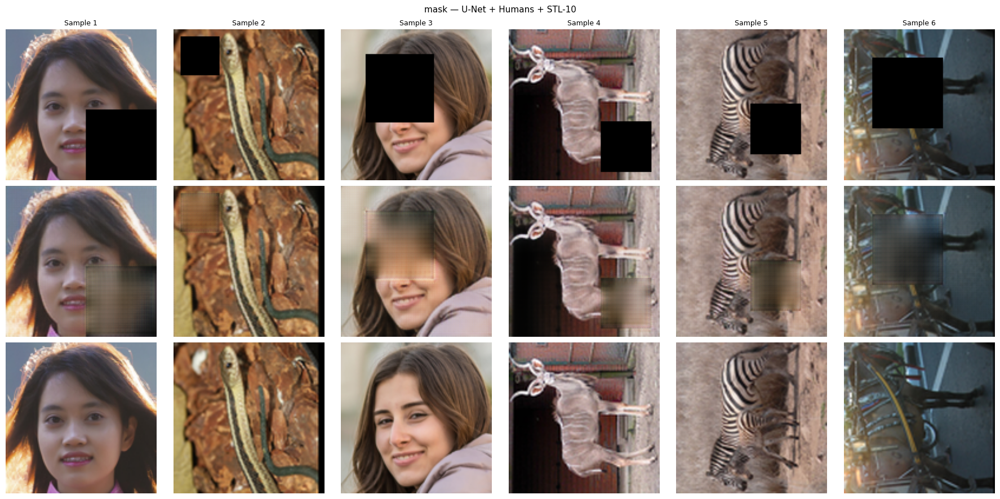

In [74]:
show_reconstruction(model_mask, 'mask')


════════════════════════════════════════════════════════════
  Tâche : noise saved in unet_noise_best.keras, warmup : 5 ep.   alpha_final : 0.7
════════════════════════════════════════════════════════════

[make_generator] 18834 images au total (noise, augment=True)
Epoch 1/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - loss: 0.0810[make_generator] 18834 images au total (noise, augment=False)
470/470 ━━━━━━━━━━━━━━━━━━━━ 198s 413ms/step - loss: 0.0634 - val_loss: 0.0667 - learning_rate: 0.0010
Epoch 2/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 195s 415ms/step - loss: 0.0536 - val_loss: 0.0509 - learning_rate: 0.0010
Epoch 3/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 185s 395ms/step - loss: 0.0517 - val_loss: 0.0539 - learning_rate: 0.0010
Epoch 4/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 188s 400ms/step - loss: 0.0495 - val_loss: 0.0510 - learning_rate: 0.0010
Epoch 5/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step - loss: 0.0495
[WarmupLoss] époque 5 : alpha 0.0 to 0.7  (MS-SSIM activé)
470/470 ━━━━━━━━━━━━━━━━━━━━ 

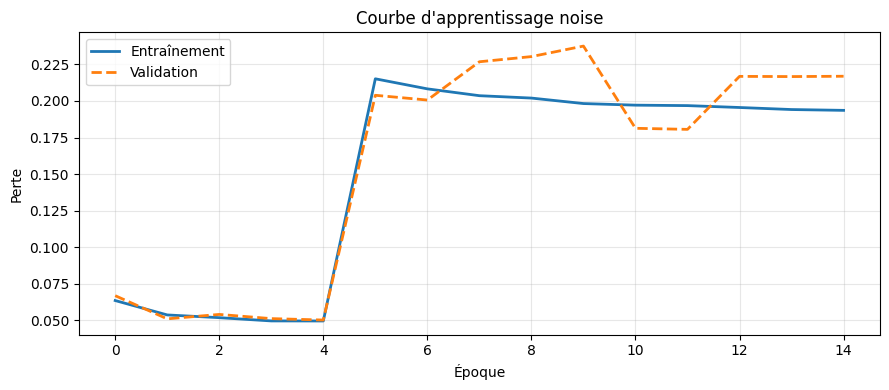

In [75]:
model_noise, history_noise = train_task(
    typeimage  = 'noise',
    model_name = 'unet_noise_best.keras',
    epochs     = 30,
    warmup     = 5,
    final_alpha      = 0.7   #moins de poids à MS-SSIM car le bruit est aléatoire
)

[make_generator] 18834 images au total (noise, augment=False)


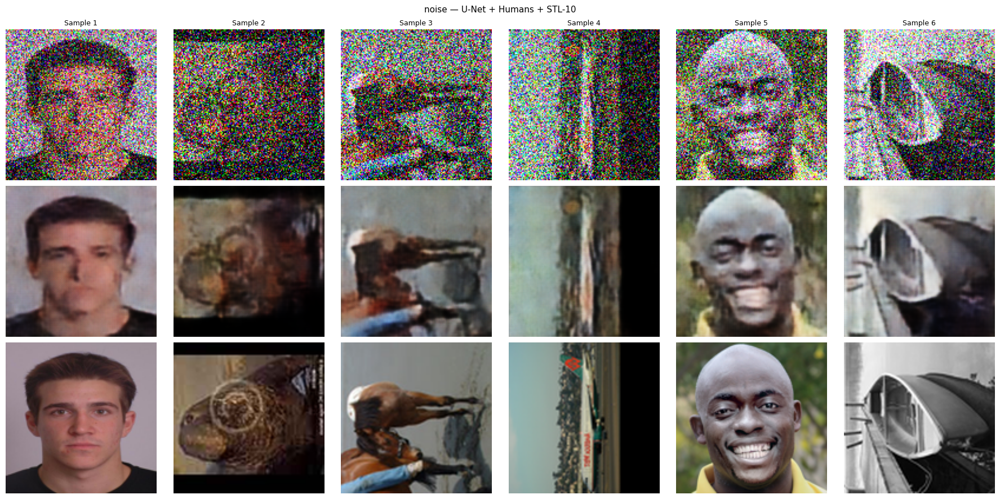

In [76]:
show_reconstruction(model_noise, 'noise')


════════════════════════════════════════════════════════════
  Tâche : blur saved in unet_blur_best.keras, warmup : 5 ep.   alpha_final : 0.7
════════════════════════════════════════════════════════════

[make_generator] 18834 images au total (blur, augment=True)
Epoch 1/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - loss: 0.0794[make_generator] 18834 images au total (blur, augment=False)
470/470 ━━━━━━━━━━━━━━━━━━━━ 191s 400ms/step - loss: 0.0622 - val_loss: 0.0853 - learning_rate: 0.0010
Epoch 2/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 202s 430ms/step - loss: 0.0499 - val_loss: 0.0397 - learning_rate: 0.0010
Epoch 3/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 190s 404ms/step - loss: 0.0485 - val_loss: 0.0530 - learning_rate: 0.0010
Epoch 4/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 184s 391ms/step - loss: 0.0468 - val_loss: 0.0496 - learning_rate: 0.0010
Epoch 5/30
470/470 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0464
[WarmupLoss] époque 5 : alpha 0.0 to 0.7  (MS-SSIM activé)
470/470 ━━━━━━━━━━━━━━━━━━━━ 190s

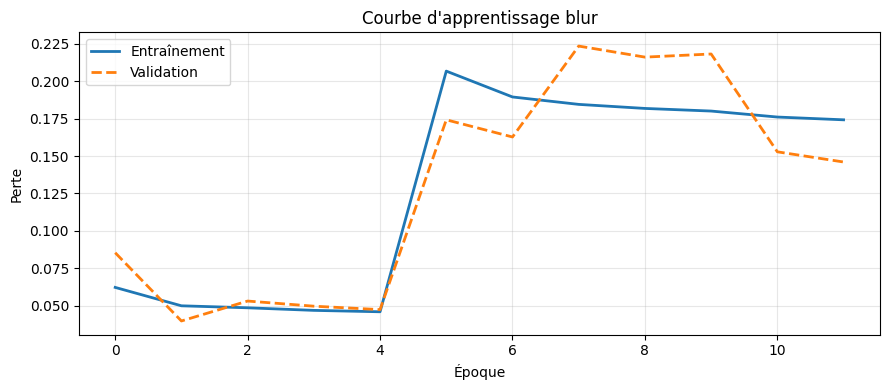

In [78]:
model_blur, history_blur = train_task(
    typeimage  = 'blur',
    model_name = 'unet_blur_best.keras',
    epochs     = 30,
    warmup     = 5,
    final_alpha      = 0.7   #moins de poids à MS-SSIM car le bruit est aléatoire
)

[make_generator] 18834 images au total (blur, augment=False)


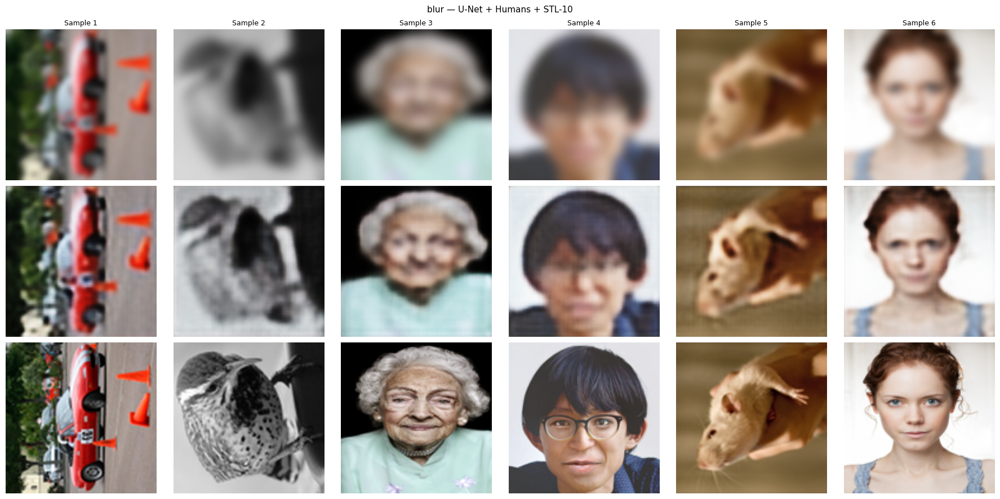

In [82]:
show_reconstruction(model_blur, 'blur')

In [ ]:
model_noise, history_noise = train_task(
    typeimage  = 'combined',
    model_name = 'unet_noise_best.keras',
    epochs     = 30,
    warmup     = 5,
    final_alpha      = 0.7 
)